In [1]:
#In order to test the DCT layer in ResNet input layer, first we will test the base model
#To do that, we will use the pre-trained ResNet-50 model from tensorflow library
#This model is already trained with Image-Net so it will be a good enough indicator

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import math
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras import Model, Input,Layer

# Load pre-trained ResNet-50 model
#werights= "imagenet" it is trained with imagenet
model = ResNet50(weights='imagenet', include_top=False)

In [2]:
#We want to visualize the feature map so we can observe better
#getting layer information from ResNet

layer_information_output = [layer.output for layer in model.layers]
#Also getting the layers names, we will use this later in plotting
layer_information_names = [layer.name for layer in model.layers]

#creating an intermediate layer
intermediate_layer_model = Model(inputs=model.input, outputs=layer_information_output)

#creating a model to fetch the outputs
model_fetch = tf.keras.Model(inputs = model.input, outputs = layer_information_output)


In [3]:
#To visualize the fetaure map, we will use test image
#The path is
IMAGE_PATH = "/content/columbia_university (1).jpg"

#resizing the image to match the input size
temp_image = load_img(IMAGE_PATH, target_size = (224,224))
#converting to an array
array_image_convert = img_to_array(temp_image)
#adding a batch dimension
array_image = np.expand_dims(array_image_convert, axis =0)
array_image = preprocess_input(array_image)

In [4]:
#To get the indermediate activcation information
intermediate_activations = intermediate_layer_model.predict(array_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


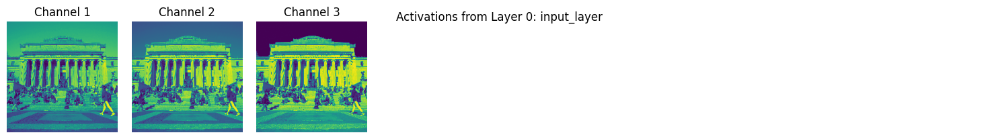

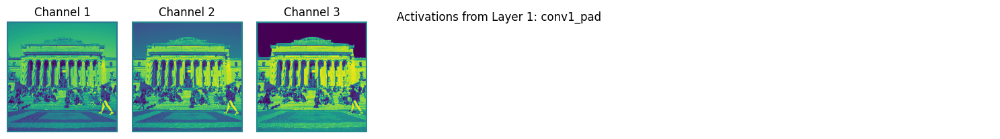

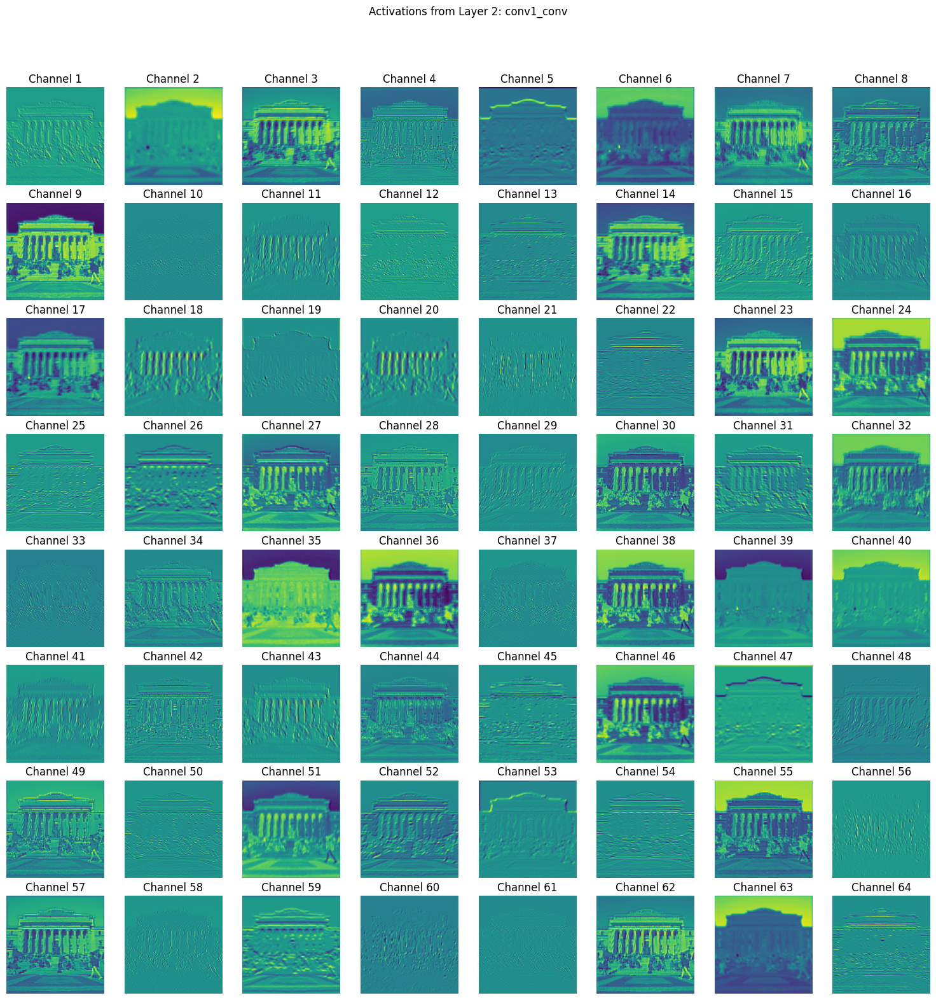

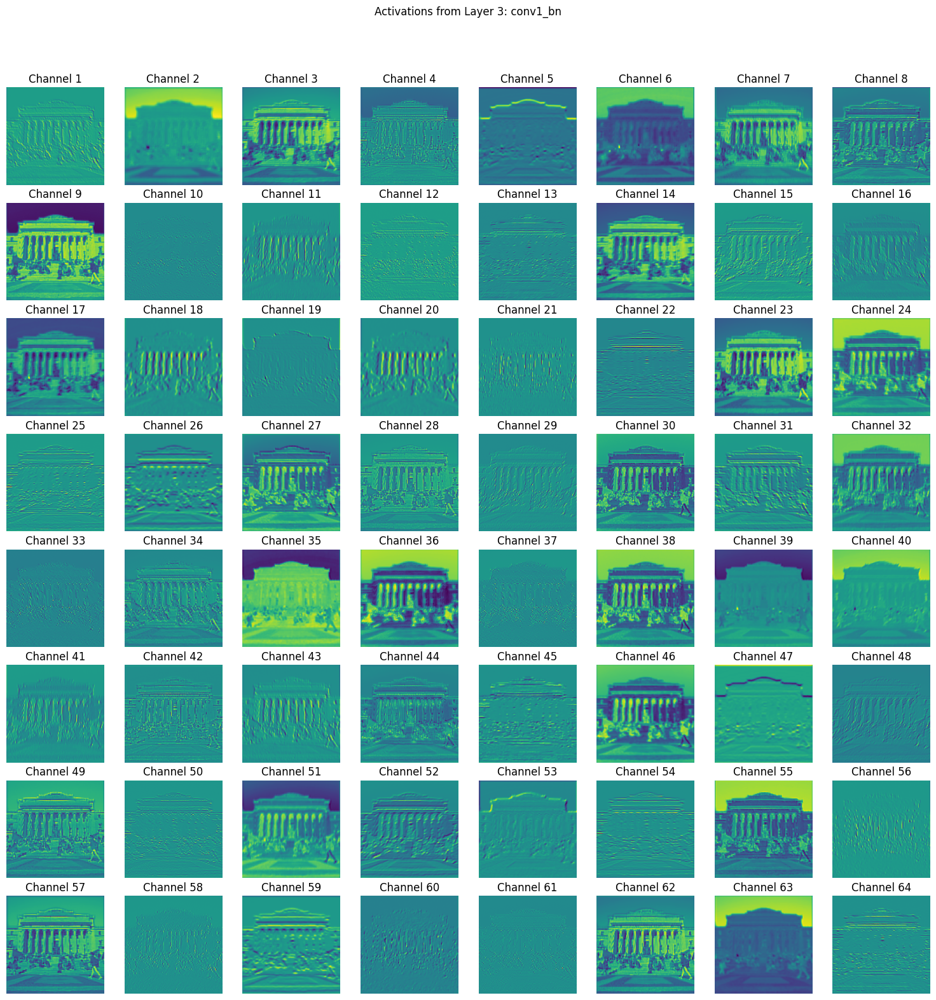

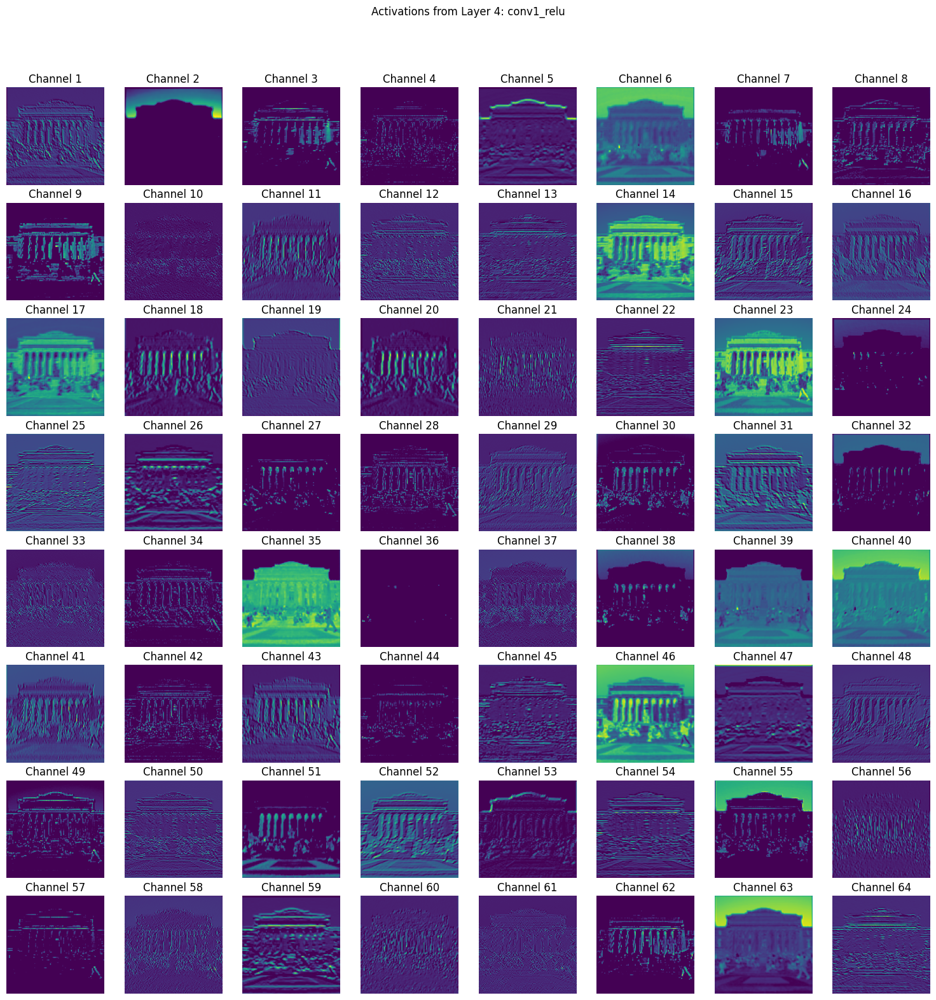

In [5]:
# First, to visualize the feature maps, we need to loop through every layer
# And then, every channel

#update - beacause visualziign every channel is too big for GitHub
#To show the feature channels only 5 layers are displayed
#To show every feature map, remove the indermediate_actiavtions[:number]

for layer_index, activation in enumerate(intermediate_activations[:5]):
    # This part is for the grid
    number_of_channels = activation.shape[-1]
    number_of_columns = 8  # Fixed number of columns per row
    number_of_rows = math.ceil(number_of_channels / number_of_columns)

    # Creating subplots for the current layer in the iteration
    fig, ax = plt.subplots(number_of_rows, number_of_columns, figsize=(15, number_of_rows * 2))
    # Flattening the axes arrays
    ax = ax.flatten()

    # Now we have the layers, we need to iterate through the channels
    for channels in range(number_of_channels):
        # Getting the channel image
        channel_image = activation[0, :, :, channels]
        ax[channels].imshow(channel_image, cmap="viridis")
        # Turning off unused axis
        ax[channels].axis("off")  # Turning this on avoids empty plots
        ax[channels].set_title(f"Channel {channels + 1}")

    # Turning off any remaining empty axes
    for remaining_ax in ax[number_of_channels:]:
        remaining_ax.axis("off")

    # Adding the layer name for the corresponding image
    # Getting the layer name
    layer_name = model.layers[layer_index].name
    # We have the corresponding name; we can visualize it
    plt.suptitle(f"Activations from Layer {layer_index}: {layer_name}")
    plt.tight_layout()
    # Adjusting the title for better readability
    plt.subplots_adjust(top=0.9)
    plt.show()



In [6]:
#Now we are going to implement DCT in ResNet-50

In [7]:
#DCT can be integrated into CNN in several ways
#Input Preprocessing:

In [8]:
#Loading a single image as a tensorflow
IMAGE_PATH_V2 = "/content/columbia_university (1).jpg"
image_v2 = tf.io.read_file(IMAGE_PATH_V2)
image_v2 = tf.image.decode_jpeg(image_v2, channels=3)
#converting the image to float32
#the values in [0,1]
image_v2 = tf.image.convert_image_dtype(image_v2, dtype=tf.float32)

In [9]:
#Now applying 2D-DCT
#Because Tensforflow only has 1D DCT, to do a 2D DCT to be used in CNNs we have to apply it twice
#Along with the width which corresponds to axis 1 and height axis = 2
#But Tensorflow doesnt support axis 1, "axis must be -1. Got: 1"
#So we will transpose do the computation and transpose back

def discrete_cosine_transform_2d(image):

  #if we have an image size [H,W,C]
  #We will apply discrete cosine transform along the width
  image_transposed = tf.transpose(image, [0,2,1])
  #Now, applying the DCT along the last axis
  #Former width
  discrete_cosine_transform_width = tf.signal.dct(image_transposed, type =2, axis = -1, norm = "ortho")
  #Because we transposed in the first place we need to convert it back
  discrete_cosine_transform_width = tf.transpose(discrete_cosine_transform_width, [0,2,1])


  #Now we have to apply the discrete cosine transform along the height
  #Now we want to transform along height which was axis = 0 originally
  #Moving height to the last axis = [H,W,C] to [W,C,H]

  dct_width_transposed = tf.transpose(discrete_cosine_transform_width, [1,2,0])
  #Now, applying the DCT along the last axis
  dct_2d = tf.signal.dct(dct_width_transposed, type =2, axis = -1, norm = "ortho")
  #Because we transposed in the first place we need to convert it back
  dct_2d = tf.transpose(dct_2d, [2,0,1])

  return dct_2d


In [10]:
#For testing with single image, removing the batch
image_single = array_image[0]  # Now shape is [224, 224, 3]

In [11]:
# dct_image is now a tensor of shape [224, 224, 3]
dct_image = discrete_cosine_transform_2d(image_single)

In [12]:
#converting to numpy array for visualizaiton
dct_image_np = dct_image.numpy()


In [13]:
#Visualizing the DCT coefficients
#Important thing here is, DCT coefficients are not pixel intensities; they represent frequency information. The DC (low-frequency) component is at the top-left corner, and high-frequency components span out towards the bottom-right.

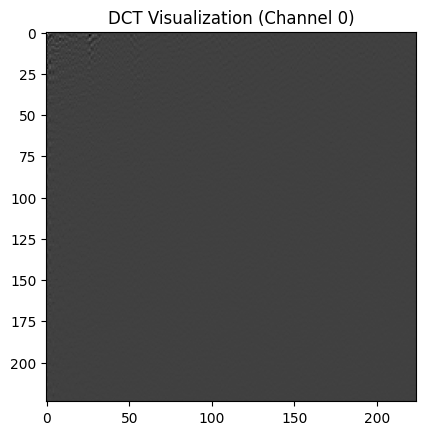

In [14]:
#visualizaiton of the DCT coef

# Select the first channel
dct_channel = dct_image_np[:,:,0]
# Normalize for visualization purposes
# Shift minimum to 0, then divide by the max for [0,1] range
min_val = dct_channel.min()
max_val = dct_channel.max()
dct_channel_norm = (dct_channel - min_val) / (max_val - min_val + 1e-8)

plt.imshow(dct_channel_norm, cmap='gray')
plt.title('DCT Visualization (Channel 0)')
plt.show()


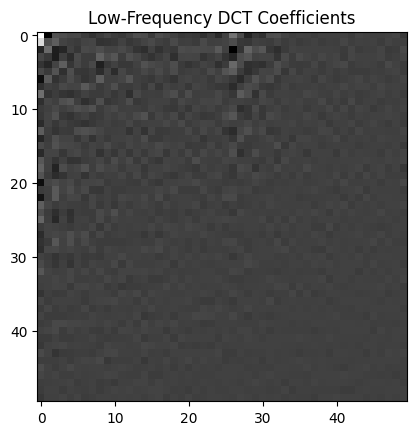

In [15]:
#To observe the low-frewuency coefs
low_freq_coef = dct_channel[:50,:50]
low_freq_norm = (low_freq_coef - low_freq_coef.min()) / (low_freq_coef.max() - low_freq_coef.min() + 1e-8)

plt.imshow(low_freq_norm, cmap='gray')
plt.title('Low-Frequency DCT Coefficients')
plt.show()

Low-frequency coefficients capture the general structure or overall patterns of an image, such as broad color transitions or smooth gradients.

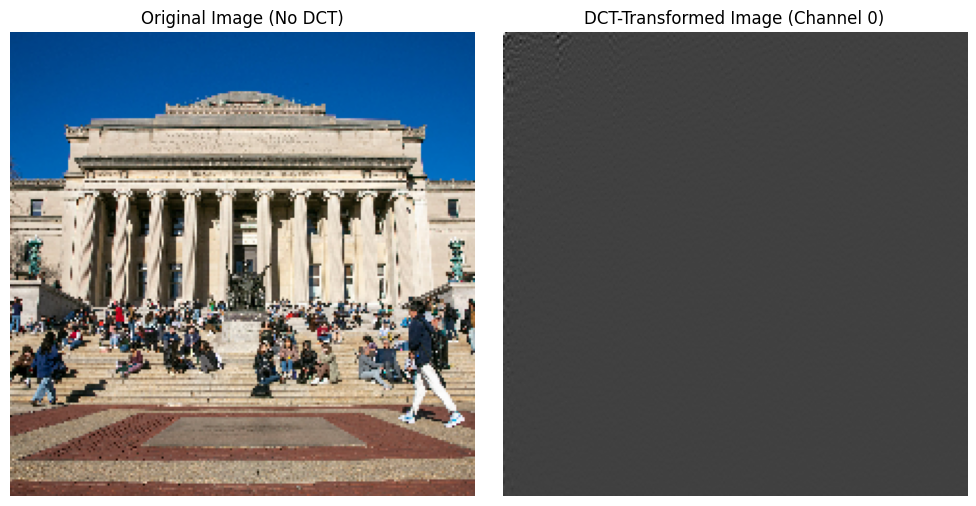

In [16]:
# Convert image to float and apply DCT
image_single_tf = tf.convert_to_tensor(image_single, dtype=tf.float32)
dct_image = discrete_cosine_transform_2d(image_single_tf).numpy()  # shape: [224,224,3]

# For visualization:

# Original image (as loaded by load_img and img_to_array)
original_image_np = np.array(temp_image).astype(np.float32) / 255.0  # normalized to [0,1]

# Prepare one channel of the DCT image for visualization
dct_channel = dct_image[:,:,0]
# Normalize the DCT channel for display
min_val, max_val = dct_channel.min(), dct_channel.max()
dct_channel_norm = (dct_channel - min_val) / (max_val - min_val + 1e-8)

# Create a figure with two subplots side-by-side
fig, axes = plt.subplots(1, 2, figsize=(10,5))

axes[0].imshow(original_image_np)
axes[0].set_title("Original Image (No DCT)")
axes[0].axis('off')

axes[1].imshow(dct_channel_norm, cmap='gray')
axes[1].set_title("DCT-Transformed Image (Channel 0)")
axes[1].axis('off')

plt.tight_layout()
plt.show()


The DCT-transformed image (Channel 0) primarily captures low-frequency components, which include broad color transitions and overall structural features of the image.
High-frequency details (like sharp edges or textures) are less prominent, which is expected, as DCT emphasizes energy compaction in low-frequency coefficients.


DCT is a frequency-domain representation. The visualization on the right does not represent an image in the usual sense but a matrix of frequency coefficients.

In [17]:
#Using Discrete Cosine Transform as part of the feature extraction layers within CNN

We can implement discrete cosine transform as a layer in that transforms feature maps from spatial domain to frequency domain before passing them to subsequent layers


#Steps
As we know, CNNs work on directly on spatial data which have the pixel intensity values in early layers, as we go deep in the networks these values changes into feature maps

Above in the ResNet-50 feature map seciton we have visualized the feature maps to observe this better.

Our proposed idea is to insert a custom discrete cosine transform layer after certain convolutional or pooling layers

This discrete cosine transform layer will take the feature maps of shape [batch size, height, width, channels] and will return with the discrete cosine transformed feature maps of the same shape

After the DCT, we will have also a frequency domain representations which might help the network learn frequency based features


After doing that, our next step is to implement a custom DCR layer. As we have already implemented a function that maps 2D discrete cosine transform, we will use the same function in our layers.

But above we did not include batch size since we were processing with a single image to observe the visualization

tf.signal.dct is differentiable, so we can flow the gradients thorugh this layer and train the network with DCT layer in place

After these steps we will normliaze the coefficients and focus on low frequency features


In [18]:
#we will implement a custom discrete cosine transform layer
class DiscreteCosineTransform2D(Layer):
  def __init__(self, **kwargs):
    super(DiscreteCosineTransform2D, self).__init__(**kwargs)

    #we need a call function

  def call(self,inputs):
    #input size [batch, height, width, channels]
    #we will do a 2D discrete cosine transform on height and then width

    #first, dct along the width axis 1
    #because tensorflow doesnt support axis 1 as we have mentioned above
    #we need to transpose
    #[B,H,W,C] --> [B,H,C,W]
    x = tf.transpose(inputs, [0,1,3,2])
    #then we apply the DCT along the last axis which is W
    x = tf.signal.dct(x, type =2, axis =-1, norm= "ortho")
    #transpose back
    x = tf.transpose(x, [0,1,3,2])
    #now its turned into [B,H,W,C]

    #We have completed the DCT transform on width
    #Now we have to do along the height
    #same as above [B,H,W,C] -> [B,W,C,H]
    x = tf.transpose(x, [0,2,1,3])
    #Apply DCT along last axis (height)
    x = tf.signal.dct(x, type =2, axis =-1, norm= "ortho")
    #Now back to the original order
    x = tf.transpose(x, [0,2,1,3])
    return x

In [19]:
#For the testing we want to start with a simple model on top of ResNet50

#define the input shape
input_shape = (224,224,3)
inputs = Input(shape = input_shape)
base_model = ResNet50(include_top=False, weights='imagenet', input_tensor=inputs)


#First we will insert our custom Discrete Cosine Transform Layer after the base model's last convolutional layer
#the shape of the layer will be [batch, 7,7,2048] for ResNet50
x = base_model.output

#Inserting the DCT layer
x = DiscreteCosineTransform2D()(x)

# Then proceeding with pooling and a dense layer as usual
x = GlobalAveragePooling2D()(x)
outputs = Dense(1000, activation='softmax')(x)

model = Model(inputs, outputs)
model.summary()

# applies a DCT transform, and then continues processing in frequency domain


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [20]:
#So far, we have the dataset and we will now compare the baseline model and the model that uses discrete cosine transform. Further we will evaluate the placement of the discrete cosine transform to see the evaluations

In [21]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications.resnet50 import preprocess_input
import numpy as np

# Load CIFAR-100 from TFDS
(ds_train, ds_val, ds_test), ds_info = tfds.load(
    'cifar100',
    split=['train[:80%]', 'train[80%:]', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)

num_classes = ds_info.features['label'].num_classes  # Should be 100 for CIFAR-100

def preprocess(image, label):
    # CIFAR-100 images are 32x32 RGB, need to be resized to 224x224 for ResNet
    image = tf.image.resize(image, (224, 224))
    image = preprocess_input(tf.cast(image, tf.float32))
    return image, label

batch_size = 128

# Create the training, validation, and test datasets
ds_train = ds_train.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.shuffle(1024).batch(batch_size).prefetch(tf.data.AUTOTUNE)

ds_val = ds_val.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
ds_val = ds_val.batch(batch_size).prefetch(tf.data.AUTOTUNE)

ds_test = ds_test.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Create a model with ResNet50 base
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras import Model

base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
outputs = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=outputs)

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', # monitor validation accuracy
    patience=3,             # stop if no improvement after 5 epochs
    restore_best_weights=True # restore the best model weights
)

# Train the model with early stopping
history = model.fit(
    ds_train,
    validation_data=ds_val,
    epochs=50,  #set a higher number of epochs; early stopping will stop training earlier if no improvement
    callbacks=[early_stopping]
)

# Evaluate the model on the test set
model.evaluate(ds_test)



Epoch 1/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 149s 278ms/step - accuracy: 0.3569 - loss: 2.5917 - val_accuracy: 0.4053 - val_loss: 2.5458
Epoch 2/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - accuracy: 0.6474 - loss: 1.2061 - val_accuracy: 0.4988 - val_loss: 1.9919
Epoch 3/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - accuracy: 0.7604 - loss: 0.7937 - val_accuracy: 0.6140 - val_loss: 1.4472
Epoch 4/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - accuracy: 0.8408 - loss: 0.5125 - val_accuracy: 0.5861 - val_loss: 1.7254
Epoch 5/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - accuracy: 0.8877 - loss: 0.3590 - val_accuracy: 0.6406 - val_loss: 1.5001
Epoch 6/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - accuracy: 0.9169 - loss: 0.2576 - val_accuracy: 0.5946 - val_loss: 1.8484
Epoch 7/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - accuracy: 0.9386 - loss: 0.1939 - val_accuracy: 0.6177 - val_loss: 1.6451
Epoch 8/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - accuracy: 0.9495 - loss: 

[1.516217589378357, 0.6431000232696533]

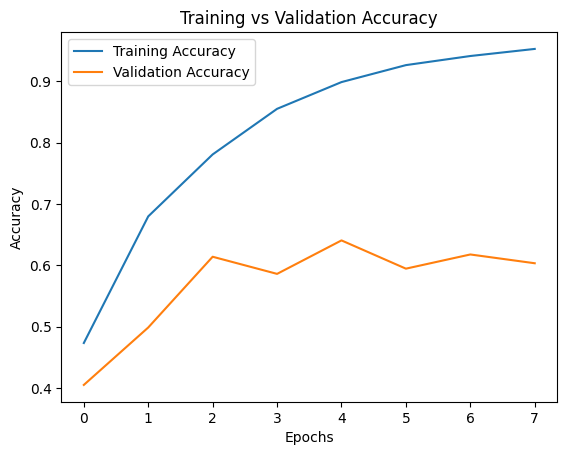

In [23]:
#When we look at the results we can directly see the model is overfitting, however to visualize it  we will use matplotlib
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()

In [22]:
#As we see from the results, the model is overfitting to get better evaluation we will use data augmentation on the dataset

In [24]:
#Same codes as above but in a single cell
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras import Model, regularizers
from tensorflow.keras import layers

# Load CIFAR-100
(ds_train_v2, ds_val_v2, ds_test_v2), ds_info_v2 = tfds.load(
    'cifar100',
    split=['train[:80%]', 'train[80%:]', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)

num_classes_v2 = ds_info_v2.features['label'].num_classes
batch_size_v2 = 128

# Data Augmentation Layers
data_augmentation_v2 = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    layers.RandomBrightness(0.1)
])

# Preprocess and Augment for Training Data
def preprocess_and_augment_v2(image, label):
    # Resize to 224x224
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    # Preprocess for ResNet50
    image = preprocess_input(image)
    # Apply augmentations
    image = data_augmentation_v2(image, training=True)
    return image, label

# Preprocess without Augmentation (For Val and Test)
def preprocess_v2(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

# Create the training, validation, and test datasets
ds_train_v2 = ds_train_v2.map(preprocess_and_augment_v2, num_parallel_calls=tf.data.AUTOTUNE)
ds_train_v2 = ds_train_v2.shuffle(1024).batch(batch_size_v2).prefetch(tf.data.AUTOTUNE)

ds_val_v2 = ds_val_v2.map(preprocess_v2, num_parallel_calls=tf.data.AUTOTUNE)
ds_val_v2 = ds_val_v2.batch(batch_size_v2).prefetch(tf.data.AUTOTUNE)

ds_test_v2 = ds_test_v2.map(preprocess_v2, num_parallel_calls=tf.data.AUTOTUNE)
ds_test_v2 = ds_test_v2.batch(batch_size_v2).prefetch(tf.data.AUTOTUNE)

# Create a model with ResNet50 base
base_model_v2 = ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))
x_v2 = base_model_v2.output
x_v2 = GlobalAveragePooling2D()(x_v2)
x_v2 = tf.keras.layers.Dropout(0.5)(x_v2)
outputs_v2 = Dense(num_classes_v2, activation='softmax',
                kernel_regularizer=regularizers.l2(1e-4))(x_v2)
model_v2 = Model(inputs=base_model_v2.input, outputs=outputs_v2)

model_v2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


# Early Stopping Callback
early_stopping_v2 = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', # monitor validation accuracy
    patience=3,             # stop if no improvement after 3 epochs
    restore_best_weights=True # restore the best model weights
)

# Train the model with early stopping
history_v2 = model_v2.fit(
    ds_train_v2,
    validation_data=ds_val_v2,
    epochs=50,  # set a higher number of epochs; early stopping will stop training earlier if no improvement
    callbacks=[early_stopping_v2]
)

# Evaluate the model on the test set
model_v2.evaluate(ds_test_v2)

Epoch 1/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 197s 446ms/step - accuracy: 0.1426 - loss: 3.8359 - val_accuracy: 0.1518 - val_loss: 3.8241
Epoch 2/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 349ms/step - accuracy: 0.3565 - loss: 2.5049 - val_accuracy: 0.2777 - val_loss: 3.1691
Epoch 3/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 348ms/step - accuracy: 0.4407 - loss: 2.1266 - val_accuracy: 0.2720 - val_loss: 3.5674
Epoch 4/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 349ms/step - accuracy: 0.4923 - loss: 1.8987 - val_accuracy: 0.4773 - val_loss: 2.0179
Epoch 5/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 112s 350ms/step - accuracy: 0.5314 - loss: 1.7456 - val_accuracy: 0.4524 - val_loss: 2.2761
Epoch 6/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 349ms/step - accuracy: 0.5619 - loss: 1.6217 - val_accuracy: 0.4703 - val_loss: 2.1625
Epoch 7/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 349ms/step - accuracy: 0.5918 - loss: 1.5190 - val_accuracy: 0.5225 - val_loss: 1.8449
Epoch 8/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 349ms/step - accuracy: 0.6132 -

[1.7658734321594238, 0.5662000179290771]

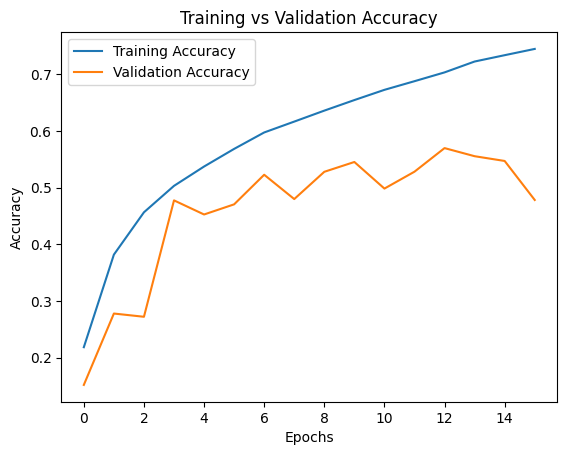

In [25]:
#When we look at the results we can directly see the model is overfitting, however to visualize it  we will use matplotlib
# Plot training and validation accuracy
plt.plot(history_v2.history['accuracy'], label='Training Accuracy')
plt.plot(history_v2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()

In [26]:
# Same imports as in your code
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras import Model, regularizers
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# Load CIFAR-100 dataset
(ds_train_v2, ds_val_v2, ds_test_v2), ds_info_v2 = tfds.load(
    'cifar100',
    split=['train[:80%]', 'train[80%:]', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)

num_classes_v2 = ds_info_v2.features['label'].num_classes
batch_size_v2 = 128

# Data Augmentation Layers (unchanged, but augmentations can be increased if necessary)
data_augmentation_v2 = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
    layers.RandomBrightness(0.2),
    layers.RandomTranslation(0.1, 0.1),
    layers.RandomCrop(224, 224)
])

# Preprocess and Augment for Training Data
def preprocess_and_augment_v2(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    image = data_augmentation_v2(image, training=True)
    return image, label

# Preprocess without Augmentation (For Validation and Test)
def preprocess_v2(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

# Create datasets
ds_train_v2 = ds_train_v2.map(preprocess_and_augment_v2, num_parallel_calls=tf.data.AUTOTUNE)
ds_train_v2 = ds_train_v2.shuffle(1024).batch(batch_size_v2).prefetch(tf.data.AUTOTUNE)

ds_val_v2 = ds_val_v2.map(preprocess_v2, num_parallel_calls=tf.data.AUTOTUNE)
ds_val_v2 = ds_val_v2.batch(batch_size_v2).prefetch(tf.data.AUTOTUNE)

ds_test_v2 = ds_test_v2.map(preprocess_v2, num_parallel_calls=tf.data.AUTOTUNE)
ds_test_v2 = ds_test_v2.batch(batch_size_v2).prefetch(tf.data.AUTOTUNE)

# Model with ResNet50 base
base_model_v2 = ResNet50(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
x_v2 = base_model_v2.output
x_v2 = GlobalAveragePooling2D()(x_v2)
x_v2 = tf.keras.layers.Dropout(0.5)(x_v2)
x_v2 = Dense(256, activation='relu',
             kernel_regularizer=regularizers.l2(1e-4),
             bias_regularizer=regularizers.l2(1e-4))(x_v2)
x_v2 = tf.keras.layers.Dropout(0.3)(x_v2)
outputs_v2 = Dense(num_classes_v2, activation='softmax',
                   kernel_regularizer=regularizers.l2(1e-4),
                   bias_regularizer=regularizers.l2(1e-4))(x_v2)

model_v2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early Stopping Callback
early_stopping_v2 = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=3,
    restore_best_weights=True
)

# Learning Rate Scheduler Callback
reduce_lr_v2 = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    min_lr=1e-6
)

# Train the model with callbacks
history_v2 = model_v2.fit(
    ds_train_v2,
    validation_data=ds_val_v2,
    epochs=50,
    callbacks=[early_stopping_v2, reduce_lr_v2]  # Added ReduceLROnPlateau
)

Epoch 1/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 227s 541ms/step - accuracy: 0.0309 - loss: 5.0421 - val_accuracy: 0.0609 - val_loss: 4.5586 - learning_rate: 0.0010
Epoch 2/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 134s 421ms/step - accuracy: 0.1065 - loss: 4.0890 - val_accuracy: 0.1002 - val_loss: 4.3378 - learning_rate: 0.0010
Epoch 3/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 135s 421ms/step - accuracy: 0.1722 - loss: 3.6269 - val_accuracy: 0.1324 - val_loss: 4.1402 - learning_rate: 0.0010
Epoch 4/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 135s 422ms/step - accuracy: 0.2253 - loss: 3.3306 - val_accuracy: 0.1961 - val_loss: 3.4988 - learning_rate: 0.0010
Epoch 5/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 135s 421ms/step - accuracy: 0.2575 - loss: 3.1564 - val_accuracy: 0.2139 - val_loss: 3.5819 - learning_rate: 0.0010
Epoch 6/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 134s 420ms/step - accuracy: 0.2992 - loss: 2.9705 - val_accuracy: 0.3071 - val_loss: 2.9775 - learning_rate: 0.0010
Epoch 7/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 135s 421ms/step - accura

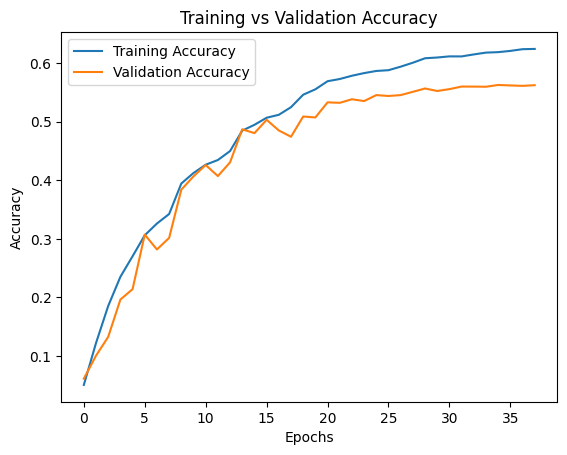

In [27]:
#When we look at the results we can directly see the model is overfitting, however to visualize it  we will use matplotlib
# Plot training and validation accuracy
plt.plot(history_v3.history['accuracy'], label='Training Accuracy')
plt.plot(history_v3.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()

In [31]:
#We can see that our model still performs bad but when we look at the graph we can observe that the overfitting is slightly reduced, but the models tends have a hard time in training

In [33]:
# With DCT Layer Two-Phase Fine-Tuning (v4)
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Input, Dropout, Layer
from tensorflow.keras import Model, layers, regularizers

# Load CIFAR-100 dataset
(ds_train_v4, ds_val_v4, ds_test_v4), ds_info_v4 = tfds.load(
    'cifar100',
    split=['train[:80%]', 'train[80%:]', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)

num_classes_v4 = ds_info_v4.features['label'].num_classes  # Should be 100
batch_size_v4 = 128

# Data Augmentation
data_augmentation_v4 = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    layers.RandomBrightness(0.1)
])

def preprocess_and_augment_v4(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    image = data_augmentation_v4(image, training=True)
    return image, label

def preprocess_v4(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

ds_train_v4 = ds_train_v4.map(preprocess_and_augment_v4, num_parallel_calls=tf.data.AUTOTUNE)
ds_train_v4 = ds_train_v4.shuffle(1024).batch(batch_size_v4).prefetch(tf.data.AUTOTUNE)

ds_val_v4 = ds_val_v4.map(preprocess_v4, num_parallel_calls=tf.data.AUTOTUNE)
ds_val_v4 = ds_val_v4.batch(batch_size_v4).prefetch(tf.data.AUTOTUNE)

ds_test_v4 = ds_test_v4.map(preprocess_v4, num_parallel_calls=tf.data.AUTOTUNE)
ds_test_v4 = ds_test_v4.batch(batch_size_v4).prefetch(tf.data.AUTOTUNE)

# Build the model with DCT layer at the front
inputs_v4 = Input(shape=(224, 224, 3))

base_model_v4 = ResNet50(include_top=False, weights='imagenet', input_tensor=inputs_v4)
x_v4 = base_model_v4.output
x_v4 = GlobalAveragePooling2D()(x_v4)
x_v4 = Dropout(0.4)(x_v4)
outputs_v4 = Dense(num_classes_v4, activation='softmax', kernel_regularizer=regularizers.l2(1e-3))(x_v4)

model_v4 = Model(inputs_v4, outputs_v4)

# Freeze base model layers
for layer in base_model_v4.layers:
    layer.trainable = False

model_v4.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping_v4 = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
reduce_lr_v4 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=3, verbose=1)

# Phase 1 training: Train only top layers for a few epochs
history_v4_phase1 = model_v4.fit(
    ds_train_v4,
    validation_data=ds_val_v4,
    epochs=5,  # Adjust as needed
    callbacks=[early_stopping_v4, reduce_lr_v4]
)

# Unfreeze some (or all) of the base model layers and fine-tune with a lower LR
# Unfreeze the last 20 layers of the base model
for layer in base_model_v4.layers[-20:]:
    layer.trainable = True

# Re-compile with a smaller learning rate for fine-tuning
model_v4.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Second phase fine-tuning
history_v4_phase2 = model_v4.fit(
    ds_train_v4,
    validation_data=ds_val_v4,
    epochs=50,  # Adjust as needed
    callbacks=[early_stopping_v4, reduce_lr_v4]
)

# Evaluate on test set
model_v4.evaluate(ds_test_v4)


Epoch 1/5
313/313 ━━━━━━━━━━━━━━━━━━━━ 106s 301ms/step - accuracy: 0.1720 - loss: 3.9041 - val_accuracy: 0.4601 - val_loss: 2.2524 - learning_rate: 0.0010
Epoch 2/5
313/313 ━━━━━━━━━━━━━━━━━━━━ 87s 270ms/step - accuracy: 0.3621 - loss: 2.7388 - val_accuracy: 0.5160 - val_loss: 2.0293 - learning_rate: 0.0010
Epoch 3/5
313/313 ━━━━━━━━━━━━━━━━━━━━ 87s 270ms/step - accuracy: 0.4026 - loss: 2.5631 - val_accuracy: 0.5341 - val_loss: 1.9638 - learning_rate: 0.0010
Epoch 4/5
313/313 ━━━━━━━━━━━━━━━━━━━━ 87s 271ms/step - accuracy: 0.4158 - loss: 2.5009 - val_accuracy: 0.5541 - val_loss: 1.8971 - learning_rate: 0.0010
Epoch 5/5
313/313 ━━━━━━━━━━━━━━━━━━━━ 87s 270ms/step - accuracy: 0.4287 - loss: 2.4519 - val_accuracy: 0.5514 - val_loss: 1.9027 - learning_rate: 0.0010
Epoch 1/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 113s 309ms/step - accuracy: 0.4190 - loss: 2.5064 - val_accuracy: 0.5664 - val_loss: 1.8294 - learning_rate: 1.0000e-05
Epoch 2/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 88s 275ms/step - accuracy: 0.

[1.5041948556900024, 0.6388999819755554]

In [34]:
#saving the model
model_v4.save('ResNet_v4.h5')
model_v3.save('ResNet_v3.h5')
model_v2.save('ResNet_v2.h5')
model.save('ResNet.h5')

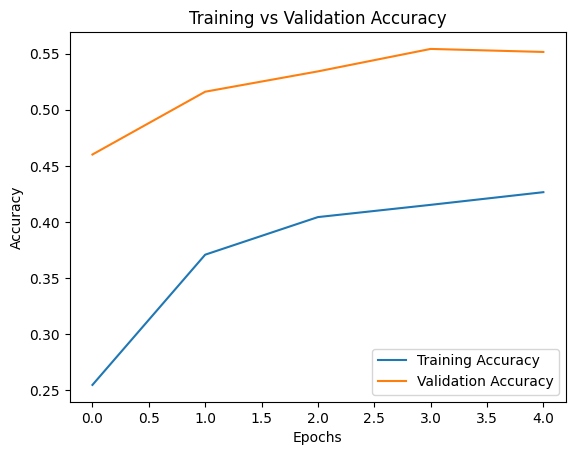

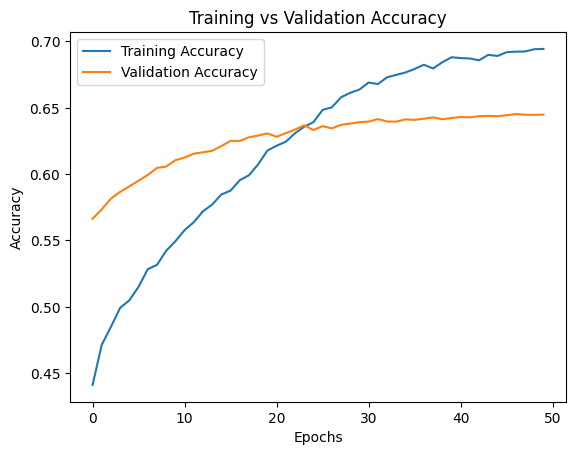

In [37]:

#When we look at the results we can directly see the model is overfitting, however to visualize it  we will use matplotlib
# Plot training and validation accuracy
plt.plot(history_v4_phase1.history['accuracy'], label='Training Accuracy')
plt.plot(history_v4_phase1.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()


#When we look at the results we can directly see the model is overfitting, however to visualize it  we will use matplotlib
# Plot training and validation accuracy
plt.plot(history_v4_phase2.history['accuracy'], label='Training Accuracy')
plt.plot(history_v4_phase2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
#With DCT Layer
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import (GlobalAveragePooling2D, Dense, Input, Dropout)
from tensorflow.keras import Model
from tensorflow.keras import layers, regularizers

# Suppose this is your custom DiscreteCosineLayer
# Adjust as per your actual implementation
class DiscreteCosineLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(DiscreteCosineLayer, self).__init__(**kwargs)

    def call(self, inputs):
        # Assume inputs: [B, H, W, C]
        # Implement your DCT logic here
        # For demonstration, let's just return inputs unchanged
        # Replace with actual DCT operations
        return inputs

# Load CIFAR-100
(ds_train, ds_val, ds_test), ds_info = tfds.load(
    'cifar100',
    split=['train[:80%]', 'train[80%:]', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)

num_classes = ds_info.features['label'].num_classes  # 100
batch_size = 128

# Data augmentation (optional)
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    layers.RandomBrightness(0.1)
])

def preprocess_and_augment(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    # Preprocess for ResNet50
    image = preprocess_input(image)
    # Augment the image
    image = data_augmentation(image, training=True)
    return image, label

def preprocess(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

ds_train = ds_train.map(preprocess_and_augment, num_parallel_calls=tf.data.AUTOTUNE)
ds_train = ds_train.shuffle(1024).batch(batch_size).prefetch(tf.data.AUTOTUNE)

ds_val = ds_val.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
ds_val = ds_val.batch(batch_size).prefetch(tf.data.AUTOTUNE)

ds_test = ds_test.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
ds_test = ds_test.batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Build the model with DCT layer at the front
inputs = Input(shape=(224,224,3))
x = DiscreteCosineLayer()(inputs)  # Apply DCT to the input images
base_model = ResNet50(include_top=False, weights='imagenet', input_tensor=x)
x = base_model.output
x = GlobalAveragePooling2D()(x)

#Adding a droput layer to reduce the overfitting
x = Dropout(0.4)(x)
#Changed the regularizer to 1e-3 from 1e-
outputs = Dense(num_classes, activation='softmax',
                kernel_regularizer=regularizers.l2(1e-3))(x)

model = Model(inputs, outputs)

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping and reduce LR
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=3, verbose=1)

history = model.fit(
    ds_train,
    validation_data=ds_val,
    epochs=50,
    callbacks=[early_stopping, reduce_lr]
)

model.evaluate(ds_test)


Epoch 1/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 211s 474ms/step - accuracy: 0.1293 - loss: 3.9333 - val_accuracy: 0.1416 - val_loss: 4.1750 - learning_rate: 0.0010
Epoch 2/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 347ms/step - accuracy: 0.3518 - loss: 2.5381 - val_accuracy: 0.2736 - val_loss: 3.1753 - learning_rate: 0.0010
Epoch 3/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 348ms/step - accuracy: 0.4299 - loss: 2.1664 - val_accuracy: 0.3687 - val_loss: 2.5676 - learning_rate: 0.0010
Epoch 4/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 347ms/step - accuracy: 0.4881 - loss: 1.9308 - val_accuracy: 0.4641 - val_loss: 2.0373 - learning_rate: 0.0010
Epoch 5/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 347ms/step - accuracy: 0.5249 - loss: 1.7796 - val_accuracy: 0.4548 - val_loss: 2.1861 - learning_rate: 0.0010
Epoch 6/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 347ms/step - accuracy: 0.5584 - loss: 1.6412 - val_accuracy: 0.4696 - val_loss: 2.0942 - learning_rate: 0.0010
Epoch 7/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 111s 348ms/step - accura

[1.670944333076477, 0.6484000086784363]